In [1]:
!nvidia-smi

Wed Nov  4 01:13:56 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 455.32.00    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   34C    P0    23W / 300W |      0MiB / 16130MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# Setup the Environment

In [2]:
!git clone https://github.com/NVIDIA/apex
%cd apex
!pip install -v --no-cache-dir --global-option="--cpp_ext" --global-option="--cuda_ext" . --user
%cd /content
%rm -rf apex

Cloning into 'apex'...
remote: Enumerating objects: 1, done.
remote: Counting objects: 100% (1/1), done.
remote: Total 7456 (delta 0), reused 0 (delta 0), pack-reused 7455
Receiving objects: 100% (7456/7456), 13.91 MiB | 10.91 MiB/s, done.
Resolving deltas: 100% (5038/5038), done.
/content/apex
/usr/local/lib/python3.6/dist-packages/pip/_internal/commands/install.py:283: UserWarning: Disabling all use of wheels due to the use of --build-options / --global-options / --install-options.
  cmdoptions.check_install_build_global(options)
Created temporary directory: /tmp/pip-ephem-wheel-cache-t_sy5jqk
Created temporary directory: /tmp/pip-req-tracker-5dtmue9u
Created requirements tracker '/tmp/pip-req-tracker-5dtmue9u'
Created temporary directory: /tmp/pip-install-ciyo3ng0
Processing /content/apex
  Created temporary directory: /tmp/pip-req-build-5ex9telp
  Added file:///content/apex to build tracker '/tmp/pip-req-tracker-5dtmue9u'
    Running setup.py (path:/tmp/pip-req-build-5ex9telp/setup

In [3]:
!git clone https://github.com/ultralytics/yolov5.git
%cd yolov5
!git checkout ec72eea62bf5bb86b0272f2e65e413957533507f #release v3
!pip install -r requirements.txt
#!./weights/download_weights.sh

Cloning into 'yolov5'...
remote: Enumerating objects: 2718, done.
remote: Total 2718 (delta 0), reused 0 (delta 0), pack-reused 2718
Receiving objects: 100% (2718/2718), 5.46 MiB | 6.28 MiB/s, done.
Resolving deltas: 100% (1804/1804), done.
/content/yolov5
Note: checking out 'ec72eea62bf5bb86b0272f2e65e413957533507f'.

You are in 'detached HEAD' state. You can look around, make experimental
changes and commit them, and you can discard any commits you make in this
state without impacting any branches by performing another checkout.

If you want to create a new branch to retain commits you create, you may
do so (now or later) by using -b with the checkout command again. Example:

  git checkout -b <new-branch-name>

HEAD is now at ec72eea Merge remote-tracking branch 'origin/master'
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-3ztmbkt7
  Running command git clone -q https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-3ztmbkt7
     |████████████████

In [1]:
import torch
import os
from PIL import Image, ImageOps
from glob import glob
import numpy as np
import shutil
from zipfile import ZipFile
import random

# What is the zip file's name?
image_data_zip_file = "250_images.zip"

# What do you want to refer to the output as?
model_name = "yolov5_2k"

# What share of the images should be in the training set?
percent_training = 0.80

add_mirror_images = True
add_salt_and_pepper = True
salt_and_peper_amounts = [0.05, 0.02]

# Data augmentation functions
def create_salt_and_pepper(image_and_coord_path, amount = 0.01):
  image_path = image_and_coord_path[0]
  coord_path = image_and_coord_path[1]
  amount_percent = int(amount * 100)
  new_image_path = image_path.split(".")
  new_image_path[0] = new_image_path[0] + "_salt_and_pepper_" + str(amount_percent)
  new_image_path = ".".join(new_image_path)
  new_coord_path = coord_path.split(".")
  new_coord_path[0] = new_coord_path[0] + "_salt_and_pepper_" + str(amount_percent)
  new_coord_path = ".".join(new_coord_path)
  if not os.path.exists(new_image_path):
    image = Image.open(image_path)
    output = np.copy(np.array(image))
    # add salt
    nb_salt = np.ceil(amount * output.size * 0.5)
    coords = [np.random.randint(0, i - 1, int(nb_salt)) for i in output.shape]
    output[tuple(coords)] = 1 #output[coords] = 1
    # add pepper
    nb_pepper = np.ceil(amount* output.size * 0.5)
    coords = [np.random.randint(0, i - 1, int(nb_pepper)) for i in output.shape]
    output[tuple(coords)] = 0 #output[coords] = 0
    new_image = Image.fromarray(output)
    new_image.save(new_image_path, quality=100)
    shutil.copyfile(coord_path, new_coord_path)
  return new_image_path, new_coord_path
      

def create_mirror_image(image_and_coord_path):
  image_path = image_and_coord_path[0]
  coord_path = image_and_coord_path[1]
  # Create the mirror image file
  new_image_path = image_path.split(".")
  new_image_path[0] = new_image_path[0] + "_mirror"
  new_image_path = ".".join(new_image_path)
  # Create the bounding box coords of the mirrored image
  new_coord_path = coord_path.split(".")
  new_coord_path[0] = new_coord_path[0] + "_mirror"
  new_coord_path = ".".join(new_coord_path)
  if not os.path.exists(new_image_path):
    im = Image.open(image_path)
    im_mirror = ImageOps.mirror(im)
    im_mirror.save(new_image_path, quality=100)
    f = open(new_coord_path, "w")
    for line in open(coord_path):
      line_parts = line.split(" ")
      line_parts[1] = str(1 - float(line_parts[1]))
      new_line = " ".join(line_parts)
      f.write(new_line)
    f.close()
  return new_image_path, new_coord_path


print('PyTorch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

PyTorch 1.6.0+cu101 _CudaDeviceProperties(name='Tesla V100-SXM2-16GB', major=7, minor=0, total_memory=16130MB, multi_processor_count=80)


In [ ]:
!ln -s /content/drive/My\ Drive/ /mydrive

In [3]:
!mkdir /content/yolov5/data/images
!mkdir /content/yolov5/data/images/training
!mkdir /content/yolov5/data/images/test
!mkdir /content/yolov5/data/labels
!mkdir /content/yolov5/data/labels/training
!mkdir /content/yolov5/data/labels/test

In [4]:
# Copy zip file from google drive
shutil.copyfile("/mydrive/"+image_data_zip_file, image_data_zip_file)
# Unzip the file to raw_data
zf = ZipFile(image_data_zip_file, "r")
zf.extractall("raw_data")
zf.close()
# Copy the config files
shutil.copyfile("/mydrive/yolov5/dataset.yaml", "/content/yolov5/dataset.yaml")
shutil.copyfile("/mydrive/yolov5/yolov5x.yaml", "/content/yolov5/models/yolov5x.yaml")

'/content/yolov5/models/yolov5x.yaml'

# Augment the Image Data

In [5]:
record_ids = {} # holds the record ids (used to split data into training and test sets)
data = {} # Holds image path and labels file path
image_count = 0
for line in open("raw_data/obj.names"): 
    line = line.strip()
    the_record_ids = set()
    print("Processing " + line + "...")
    the_directory = line.replace(" ", "_")
    coords = labels = glob("raw_data/" + the_directory + "/*.txt")
    for coords_path in coords:
      if "_mirror" not in coords_path and "_salt" not in coords_path:
        image_count += 1
        record_id = int(coords_path.split("/")[-1].split(".txt")[0])
        the_record_ids.add(str(record_id))
        # Find the image file
        pattern = "raw_data/" + the_directory + "/*" + str(record_id) + ".j*"
        image_path = [x for x in glob(pattern) if x not in coords_path][0]
        data[str(record_id)] = (image_path, coords_path)
        if add_mirror_images:
          image_count += 1
          mirror_record_id = str(record_id) + "_mirror"
          new_image_path, new_coords_path = create_mirror_image(data[str(record_id)])
          data[mirror_record_id] = (new_image_path, new_coords_path)
          the_record_ids.add(mirror_record_id)
    record_ids[line] = the_record_ids
print(str(image_count) + " images ready")
  

Processing Poison Ivy...
Processing Virginia Creeper...
Processing Bramble...
Processing Box Elder...
2000 images ready


In [6]:
if add_salt_and_pepper:
  for amount in salt_and_peper_amounts:
    for line in open("raw_data/obj.names"):
      line = line.strip()
      print("Processing " + line + "...")
      the_directory = line.strip().replace(" ", "_")
      the_record_ids = record_ids[line]
      for record_id in the_record_ids.copy():
        salt_and_peper_record_id = record_id + "_salt_and_pepper_" + str(int(amount * 100))
        the_record_ids.add(salt_and_peper_record_id)
        data[salt_and_peper_record_id] = create_salt_and_pepper(data[record_id], amount)
        image_count += 1
      record_ids[line] = the_record_ids
print(str(image_count) + " images ready")

Processing Poison Ivy...
Processing Virginia Creeper...
Processing Bramble...
Processing Box Elder...
Processing Poison Ivy...
Processing Virginia Creeper...
Processing Bramble...
Processing Box Elder...
8000 images ready


# Train Test Split

In [7]:
random.seed(42)
training_image_paths = set()
test_image_paths = set()
for line in open("raw_data/obj.names"): 
    line = line.strip()
    the_record_ids = record_ids[line]
    n_train = int(round(len(the_record_ids) * percent_training, 0))
    for_training = random.sample(list(the_record_ids), n_train)
    for_testing = np.setdiff1d(list(the_record_ids), for_training)
    for i in for_training:
      for file_path in data[i]:
        new_file_path = file_path.split("/")
        if "txt" in new_file_path[-1]:
          new_file_path = "yolov5/data/labels/training/" + new_file_path[-1]
        else:
          new_file_path = "yolov5/data/images/training/" + new_file_path[-1]
          training_image_paths.add(new_file_path)
        shutil.move(file_path, new_file_path)
          
    for i in for_testing:
      for file_path in data[i]:
        new_file_path = file_path.split("/")
        if "txt" in new_file_path[-1]:
          new_file_path = "yolov5/data/labels/test/" + new_file_path[-1]
        else:
          new_file_path = "yolov5/data/images/test/" + new_file_path[-1]
          test_image_paths.add(new_file_path)
        shutil.move(file_path, new_file_path)        



# Train the Model

<pre>
var keep_alive = false;
 
function ClickConnect(){
  if (keep_alive){
    console.log("Working"); 
    document
      .querySelector('#top-toolbar > colab-connect-button')
      .shadowRoot.querySelector('#connect')
      .click();
  }
}
setInterval(ClickConnect,60000);
</pre>

In [8]:
%cd yolov5
!python train.py --batch 16 --epochs 300 --data dataset.yaml --cfg models/yolov5x.yaml --weights "" --cache

/content/yolov5
{'lr0': 0.01, 'momentum': 0.937, 'weight_decay': 0.0005, 'giou': 0.05, 'cls': 0.58, 'cls_pw': 1.0, 'obj': 1.0, 'obj_pw': 1.0, 'iou_t': 0.2, 'anchor_t': 4.0, 'fl_gamma': 0.0, 'hsv_h': 0.014, 'hsv_s': 0.68, 'hsv_v': 0.36, 'degrees': 0.0, 'translate': 0.0, 'scale': 0.5, 'shear': 0.0}
Namespace(adam=False, batch_size=16, bucket='', cache_images=True, cfg='models/yolov5x.yaml', data='dataset.yaml', device='', epochs=300, evolve=False, img_size=[640, 640], multi_scale=False, name='', noautoanchor=False, nosave=False, notest=False, rect=False, resume=False, single_cls=False, weights='')
Using CUDA Apex device0 _CudaDeviceProperties(name='Tesla V100-SXM2-16GB', total_memory=16130MB)

2020-11-04 01:36:42.175013: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
Start Tensorboard with "tensorboard --logdir=runs", view at http://localhost:6006/

              from  n    params  module                              

In [9]:
!python test.py --data dataset.yaml --weights weights/last.pt --verbose

Namespace(augment=False, batch_size=32, conf_thres=0.001, data='dataset.yaml', device='', img_size=640, iou_thres=0.65, merge=False, save_json=False, single_cls=False, task='val', verbose=True, weights='weights/last.pt')
Using CUDA device0 _CudaDeviceProperties(name='Tesla V100-SXM2-16GB', total_memory=16130MB)

Model Summary: 407 layers, 8.84538e+07 parameters, 0 gradients
Fusing layers...
Model Summary: 284 layers, 8.84108e+07 parameters, 8.45317e+07 gradients
Caching labels data/labels/test.npy (1600 found, 0 missing, 0 empty, 0 duplicate, for 1600 images): 100% 1600/1600 [00:00<00:00, 20087.48it/s]
               Class      Images     Targets           P           R      mAP@.5  mAP@.5:.95:   0% 0/50 [00:00<?, ?it/s]/content/yolov5/utils/utils.py:580: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:766.)
  i, j 

In [10]:
!python test.py --data dataset.yaml --weights weights/best.pt --verbose

Namespace(augment=False, batch_size=32, conf_thres=0.001, data='dataset.yaml', device='', img_size=640, iou_thres=0.65, merge=False, save_json=False, single_cls=False, task='val', verbose=True, weights='weights/best.pt')
Using CUDA device0 _CudaDeviceProperties(name='Tesla V100-SXM2-16GB', total_memory=16130MB)

Model Summary: 407 layers, 8.84538e+07 parameters, 0 gradients
Fusing layers...
Model Summary: 284 layers, 8.84108e+07 parameters, 8.45317e+07 gradients
Caching labels data/labels/test.npy (1600 found, 0 missing, 0 empty, 0 duplicate, for 1600 images): 100% 1600/1600 [00:00<00:00, 18467.81it/s]
               Class      Images     Targets           P           R      mAP@.5  mAP@.5:.95:   0% 0/50 [00:00<?, ?it/s]/content/yolov5/utils/utils.py:580: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:766.)
  i, j 

In [11]:
os.mkdir("/mydrive/yolov5/" + model_name)
shutil.copy("/content/yolov5/results.txt", "/mydrive/yolov5/" + model_name + "/results.txt")
shutil.copy("/content/yolov5/weights/last.pt", "/mydrive/yolov5/" + model_name + "/last.pt")
shutil.copy("/content/yolov5/weights/best.pt", "/mydrive/yolov5/" + model_name + "/best.pt")


'/mydrive/yolov5/yolov5_2k/best.pt'

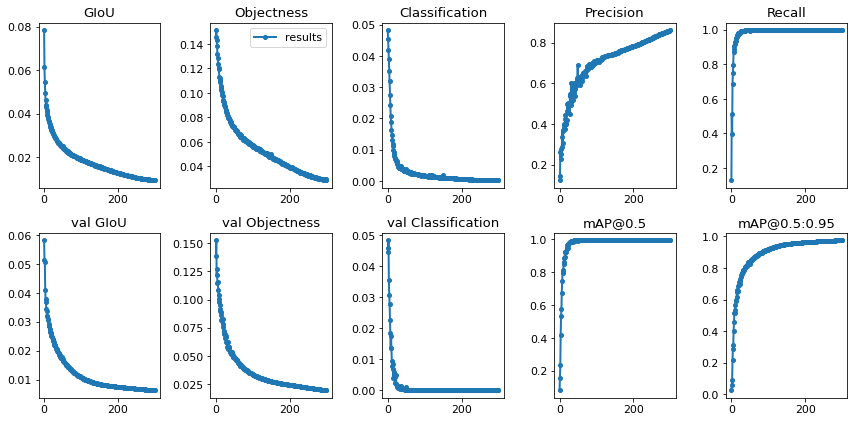

In [12]:
from utils import utils
utils.plot_results() 

In [13]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>